<a href="https://colab.research.google.com/github/bxck75/A1_Colabs/blob/master/diamondpainting_img_3_canvas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!rm -r /content/diamondcanvas
#!rm -r /content/diamond-art
#!rm -r /content/sample_data

clone repos

In [ ]:
import os
os.chdir('/content')
os.system('git clone https://github.com/bxck75/diamond-art.git')
os.chdir('/content/diamond-art')
os.system('python setup.py install')
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn-white')
%matplotlib inline
import numpy as np
import requests


!curl  https://raw.githubusercontent.com/nathantspencer/DMC-ColorCodes/master/result.csv -o dmc_table.csv

<ipython-input-1-e3943ebdd6a1>:8: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 14067  100 14067    0     0  35703      0 --:--:-- --:--:-- --:--:-- 35612


In [ ]:
os.system('mkdir -p /content/diamondcanvas')
os.system('mkdir -p /content/diamondcanvas/images')
os.system('mkdir -p /content/diamondcanvas/images/color_shifts')
os.system('mkdir -p /content/diamondcanvas/images/canvas')

0

##papersizes

De A3 formaat afmetingen zijn: 29,7 x 42 cm. of 297 x 420 mm dus een grid van 115x165 laat genoeg marge over op a3 formaat


A0-formaat

 	
84,1 x 118,9 cm

A1-formaat

 	
59,4 x 84 cm

A2-formaat

 	
42 x 59,4 cm

A3-formaat

 	
29,7 x 42 cm

In [ ]:
paper_formats= [['A0',[841,1180]],
                ['A1',[594,840]],
                ['A2',[420,594]],
                ['A3',[297,420]]]
cel_size = 2.5
cells_away_from_edge = 2
for i in range(len(paper_formats)):
  format_name =  paper_formats[i][0]
  paper_format = paper_formats[i][1]
  max_x_cells = paper_format[1] / cel_size
  max_y_cells = paper_format[0] / cel_size
  if len(paper_formats[i]) < 3:
    paper_formats[i].append([str(round(max_y_cells - cells_away_from_edge)), str(round(max_x_cells - cells_away_from_edge))])
    paper_formats[i].append(str(round((max_y_cells - cells_away_from_edge) * (max_x_cells - cells_away_from_edge))))


format = paper_formats[2] # A3
canvas_res = [format[1][1], format[1][0]] #resolution w/h 
grid_res = [format[2][1], format[2][0]] #grid w/h 

##setup

In [ ]:
##@title String fields

# 'https://assets.rebelmouse.io/media-library/junichi-shimodaira-s-rod-riguez.jpg?id=31159124&width={int(canvas_res[0])}&height={int(canvas_res[0])}&quality=100'
input_img_url = 'https://www.trmdesignco.com/uploads/5/3/4/6/53463847/super-psychedelic-splash-with-signature-jpeg_orig.jpg' #@param {type:"string"}
name = 'zomaar' #@param {type:"string"}
name, ext= os.path.splitext(input_img_url)

split_path = name.split('/')
split_filename = split_path.pop()
filename = "".join(split_filename)
param_split = ext.split('?')
ext = param_split.pop()
params ="?".join(param_split)

input_image = '/content/diamondcanvas/'+filename+'_images/'+filename+'.png'
os.makedirs('/content/diamondcanvas/'+filename+'_images', exist_ok=True)
#print("/".join(split_path)+"/")
       
print(input_img_url)
try:
  response = requests.get(input_img_url)
except requests.exceptions.Timeout:
  # Maybe set up for a retry, or continue in a retry loop
  print("TimeOut!")
except requests.exceptions.TooManyRedirects:
  # Tell the user their URL was bad and try a different one
  print("TooManyRedirects!")
except requests.exceptions.RequestException as e:
  # catastrophic error. bail.
  print("RequestException", end="")
  print(e)
  raise SystemExit(e)

with open(input_image, 'wb') as f:
  f.write(response.content)




https://www.trmdesignco.com/uploads/5/3/4/6/53463847/super-psychedelic-splash-with-signature-jpeg_orig.jpg


In [ ]:
from ast import Param
from PIL import Image, ImageColor, ImageEnhance

im = Image.open(input_image)
fill_color = (120,8,220)  # your new background color
im = im.convert("RGBA")   # it had mode P after DL it from OP
if im.mode in ('RGBA', 'LA'):
    background = Image.new(im.mode[:-1], im.size, fill_color)
    background.paste(im, im.split()[-1]) # omit transparency
    im = background

im.convert("RGB").save(r"/content/diamondcanvas/images/RGBA_art_url.png")
# switch to RGBA image
input_image = '/content/diamondcanvas/images/RGBA_art_url.png'
# open the image
im = Image.open(input_image)
# using Image.ADAPTIVE to avoid dithering
clrs = 64 # !!!!!!! number of colors in palette !!!!!!!!
out = im.convert('P', palette=Image.ADAPTIVE, colors=clrs)
#get name and ext
name, ext= os.path.splitext(input_image)
# morph inputname into outputname
output_image = input_image.replace(name, name + '_'+ str(clrs)+'_'+ str(grid_res[0] +'x'+ grid_res[1]))
#resize and save
resized = out.resize((int(canvas_res[0]),int(canvas_res[1])))
resized.save(output_image)

In [ ]:

# build drill canvas
os.system("diamond_art "+output_image+" "+output_image.replace('images/','images/canvas/').replace('.png','_canvas.png') + " -d 200 -g 2.8")

0

In [ ]:
import numpy as np
import cv2
  
# Open the image.
!curl https://media.geeksforgeeks.org/wp-content/uploads/20190724220951/cat_damaged.png -o /content/cat_damaged.png
!curl https://media.geeksforgeeks.org/wp-content/uploads/20190724221007/cat_mask.png -o /content/cat_mask.png


img = cv2.imread('/content/cat_damaged.png')
  
# Load the mask.
mask = cv2.imread('/content/cat_mask.png', 0)
  
# Inpaint.
dst = cv2.inpaint(img, mask, 3, cv2.INPAINT_NS)
  
# Write the output.
cv2.imwrite('/content/cat_inpainted.png', dst)

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  236k  100  236k    0     0   624k      0 --:--:-- --:--:-- --:--:--  624k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1185  100  1185    0     0   5511      0 --:--:-- --:--:-- --:--:--  5486


True

In [ ]:
def inpaint(img_path):
    # importing libraries
    from google.colab.patches import cv2_imshow
    import cv2
    import numpy as np

    # reading image
    img = cv2.imread(img_path)

    # Edges
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.medianBlur(gray, 5)
    edges = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
            cv2.THRESH_BINARY, 9, 9)

    # Cartoonization
    color = cv2.bilateralFilter(img, 9, 250, 250)
    cartoon = cv2.bitwise_and(color, color, mask=edges)
    p_cartoon = toImgPIL(cartoon)
    #p_cartoon.save("/content/cartoon.jpg')")
    cv2_imshow(img)
    #cv2_imshow(edges)
    cv2_imshow(cartoon)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


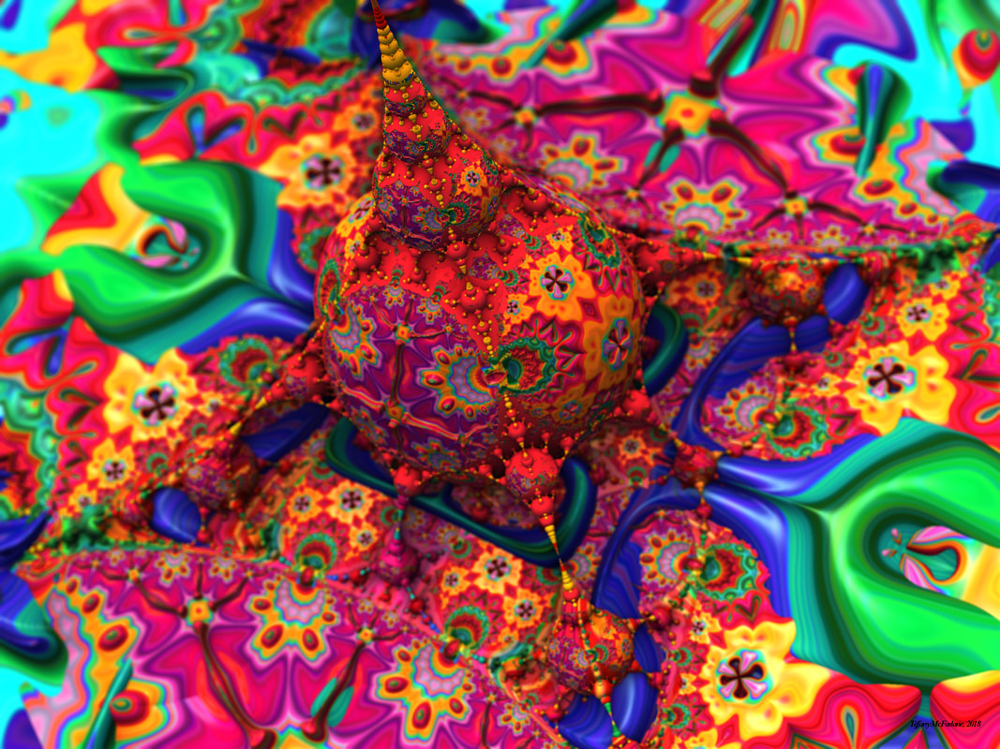

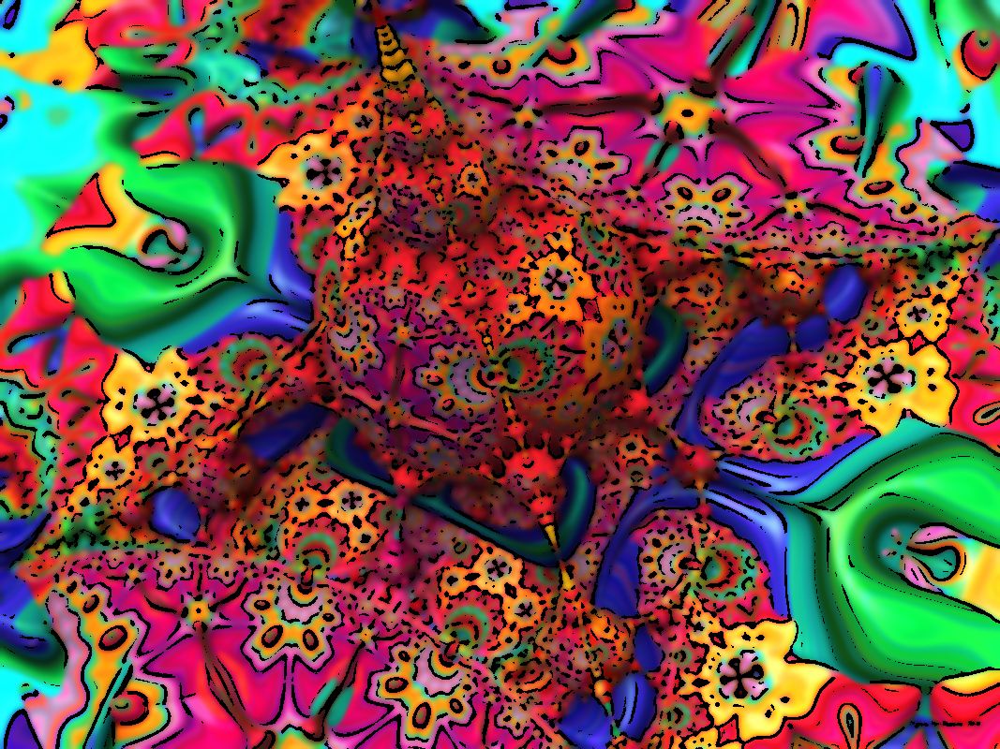

In [ ]:
#!wget https://www.trmdesignco.com/uploads/5/3/4/6/53463847/super-psychedelic-splash-with-signature-jpeg_orig.jpg
inpaint('/content/diamond-art/super-psychedelic-splash-with-signature-jpeg_orig.jpg')

##Request rgbdmc

In [ ]:
def getDMC(hex):
    return requests.get('https://dmc.crazyartzone.com/rgb_to_dmc.php?rgb=' + hex)

def getRGB(dmc) :
    return requests.get('https://dmc.crazyartzone.com/dmc_to_rgb_value.php?dmc=' + dmc)


In [ ]:
from IPython.core.display import json
from bs4 import BeautifulSoup
import re, pprint

#!wget https://raw.githubusercontent.com/nathantspencer/DMC-ColorCodes/master/result.csv
#!git clone https://github.com/bxck75/Image-To-DMCFloss-Converter.git

dmccol = getDMC('FFE2E2')
rgbcol = getRGB(str(5200)) #white

#RGBToDMC  = "https://dmc.crazyartzone.com/rgb_to_dmc.php?rgb="+str(hexcol)
#DMCToRGB = 'https://dmc.crazyartzone.com/dmc_to_rgb_value.php?dmc=' + str(dmccol)



header = dmccol.headers
d_cont = dmccol.content
header = rgbcol.headers
r_cont = rgbcol.content

de = []
ar = []

soup = BeautifulSoup(r_cont)
for r in soup.find_all("div"):
    ar.append(r.get_text().strip())
    print(r.get_text().strip())

soup = BeautifulSoup(d_cont)
for d in soup.find_all("div"):
    de.append(d.get_text().strip())
    print(d.get_text().strip())
#for c in soup.find("a"):
 #   print(c)    
    #pprint.pprint(d)


Streaming output truncated to the last 5000 lines.
 930 

 3750 



 828 

 3761 

 519 

 518 

 3760 

 517 

 3842 

 311 

 747 

 3766 

 807 

 806 

 3765 

 3811 

 598 

 597 

 3810 

 3809 

 3808 

 928 

 927 

 926 

 3768 

 924 

 3849 

 3848 

 3847 



 964 

 959 

 958 

 3812 

 3851 

 943 

 3850 

 993 

 992 

 3814 

 991 

 966 

 564 

 563 

 562 

 505 

 3817 

 3816 

 163 

 3815 

 561 

 504 

 3813 

 503 

 502 

 501 

 500 



 955 

 954 

 913 

 912 

 911 

 910 

 909 

 3818 

 369 

 368 

 320 

 367 

 319 

 890 

 164 

 989 

 988 

 987 

 986 

 772 

 3348 

 3347 

 3346 

 3345 

 895 




  
			


11
12
13
14
15
16
17
18
19
20




 704 

 703 

 702 

 701 

 700 

 699 

 907 

 906 

 905 

 904 

 472 

 471 

 470 

 469 

 937 

 936 

 935 

 934 

 523 

 3053 

 3052 

 3051 

 524 

 522 

 520 



 3364 

 3363 

 3362 

 165 

 3819 

 166 

 581 

 580 

 734 

 733 

 732 

 731 

 730 

 3013 

 3012 

 3011 

 372

TypeError: ignored

In [ ]:
print(len(de))
print(len(ar))
pprint.pprint(de)
pprint.pprint(ar)

Streaming output truncated to the last 5000 lines.
 '\n'
 ' 12AEBA \n'
 '\n'
 '\n'
 '\n'
 ' C7CAD7 \n'
 '\n'
 ' 999FB7 \n'
 '\n'
 ' 7880A4 \n'
 '\n'
 ' EEFCFC \n'
 '\n'
 ' D9EBF1 \n'
 '\n'
 ' CDDFED \n'
 '\n'
 ' B8D2E6 \n'
 '\n'
 ' 92B4CE \n'
 '\n'
 ' 739FC1 \n'
 '\n'
 ' 5A8FB8 \n'
 '\n'
 ' 35668B \n'
 '\n'
 ' 2C597C \n'
 '\n'
 ' 253B73 \n'
 '\n'
 ' 213063 \n'
 '\n'
 ' 1B2853 \n'
 '\n'
 ' DBE2E9 \n'
 '\n'
 ' C7D1DB \n'
 '\n'
 ' A2B5C6 \n'
 '\n'
 ' 6A859E \n'
 '\n'
 ' 455C71 \n'
 '\n'
 ' 384C5E \n'
 '\n'
 '\n'
 '\n'
 ' C5E8ED \n'
 '\n'
 ' ACD8E2 \n'
 '\n'
 ' 7EB1C8 \n'
 '\n'
 ' 4F93A7 \n'
 '\n'
 ' 3E85A2 \n'
 '\n'
 ' 3B768F \n'
 '\n'
 ' 32667C \n'
 '\n'
 ' 1C5066 \n'
 '\n'
 ' E5FCFD \n'
 '\n'
 ' 99CFD9 \n'
 '\n'
 ' 64ABBA \n'
 '\n'
 ' 3D95A5 \n'
 '\n'
 ' 347F8C \n'
 '\n'
 ' BCE3E6 \n'
 '\n'
 ' 90C3CC \n'
 '\n'
 ' 5BA3B3 \n'
 '\n'
 ' 488E9A \n'
 '\n'
 ' 3F7C85 \n'
 '\n'
 ' 366970 \n'
 '\n'
 ' DDE3E3 \n'
 '\n'
 ' BDCBCB \n'
 '\n'
 ' 98AEAE \n'
 '\n'
 ' 657F7F \n'
 '\n'
 ' 566A6A \n'
 '\n'

##eXTRA STUFF

In [ ]:
from matplotlib.colors import LinearSegmentedColormap

def grayscale_cmap(cmap):
    """Return a grayscale version of the given colormap"""
    cmap = plt.cm.get_cmap(cmap)
    colors = cmap(np.arange(cmap.N))
    
    # Convert RGBA to perceived grayscale luminance
    # cf. http://alienryderflex.com/hsp.html
    RGB_weight = [0.299, 0.587, 0.114]
    luminance = np.sqrt(np.dot(colors[:, :3] ** 2, RGB_weight))
    colors[:, :3] = luminance[:, np.newaxis]
        
    return LinearSegmentedColormap.from_list(
        cmap.name + "_gray", colors, cmap.N)
    

def view_colormap(cmap):
    """Plot a colormap with its grayscale equivalent"""
    cmap = plt.cm.get_cmap(cmap)
    colors = cmap(np.arange(cmap.N))
    
    cmap = grayscale_cmap(cmap)
    grayscale = cmap(np.arange(cmap.N))
    
    fig, ax = plt.subplots(2, figsize=(6, 2), subplot_kw=dict(xticks=[], yticks=[]))
    ax[0].imshow([colors], extent=[0, 10, 0, 1])
    ax[1].imshow([grayscale], extent=[0, 10, 0, 1])

In [ ]:
def toImgOpenCV(imgPIL): # Conver imgPIL to imgOpenCV
    i = np.array(imgPIL) # After mapping from PIL to numpy : [R,G,B,A]
                         # numpy Image Channel system: [B,G,R,A]
    red = i[:,:,0].copy(); i[:,:,0] = i[:,:,2].copy(); i[:,:,2] = red;
    return i; 

def toImgPIL(imgOpenCV): return Image.fromarray(cv2.cvtColor(imgOpenCV, cv2.COLOR_BGR2RGB));

In [ ]:
def plotColor(args):
    #  initialize
    colm = args
    df['R'] = ""
    df['G'] = ""
    df['B'] = ""

    #  get RGB codes for colors from dataframe[colm]
    for idx,color in df[colm].dropna().items():
        r,g,b = colors.to_rgb(color)
        df['R'].loc[idx] = r
        df['G'].loc[idx] = g
        df['B'].loc[idx] = b
    

    #  sort colors by RGB, use a tmp dataframe
    dfRGB = df[[colm,'R','G','B']].dropna().sort_values(by=['R','G','B'], ascending=False)
    #  reset index in tmp dataframe
    dfRGB.reset_index(drop=True, inplace = True)   # reset index


    #  PLOT colors from sorted dataframe
    color_count = len(dfRGB[dfRGB.columns[0]])
    a = 3                     #  number of columns
    b = int(color_count/a)+1  #  number of rows
    c = 1                     #  subplot counter  
    plt.figure(figsize=(a*4,b))
    
    for j in dfRGB[colm]:
        plt.subplot(b, a, c)  # row, column, counter
        plt.axis('off')
        plt.text(0,0.04, j, color = 'black', fontsize = 18)
        plt.hlines(0,0,10, color = j ,linestyles = 'solid', linewidth = 30)
        c = c + 1

    plt.tight_layout()
    plt.show()

    
    #  cleanup dataframe
    df.drop(['R','G','B'], axis=1, inplace=True)
    return

print('\tfuntion plotColor created ...')

	funtion plotColor created ...


<ipython-input-83-990d81c4cc61>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(cmap)
<ipython-input-83-990d81c4cc61>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(cmap)


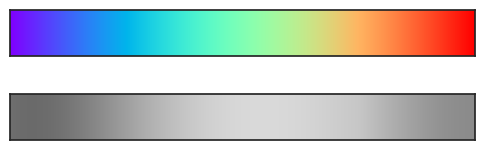

In [ ]:
view_colormap('rainbow')

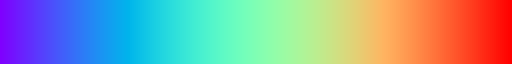

In [ ]:
sns.color_palette("rainbow", as_cmap=True)

In [ ]:
import cv2
import numpy

color_map = [
    cv2.COLORMAP_AUTUMN,
    cv2.COLORMAP_BONE,
    cv2.COLORMAP_JET,
    cv2.COLORMAP_WINTER,
    cv2.COLORMAP_RAINBOW,
    cv2.COLORMAP_OCEAN,
    cv2.COLORMAP_SUMMER,
    cv2.COLORMAP_SPRING,
    cv2.COLORMAP_COOL,
    cv2.COLORMAP_HSV,
    cv2.COLORMAP_PINK,
    cv2.COLORMAP_HOT,
    cv2.COLORMAP_PARULA,
    cv2.COLORMAP_MAGMA,
    cv2.COLORMAP_INFERNO,
    cv2.COLORMAP_PLASMA,
    cv2.COLORMAP_VIRIDIS,
    cv2.COLORMAP_CIVIDIS,
    cv2.COLORMAP_TWILIGHT,
    cv2.COLORMAP_TWILIGHT_SHIFTED,
    cv2.COLORMAP_TURBO,
    cv2.COLORMAP_DEEPGREEN
]

images_array = []

img = cv2.imread('/content/diamondcanvas/images/fractal1.png', cv2.IMREAD_GRAYSCALE)

#for x in range(len(color_map)):
im_color = cv2.applyColorMap(img, color_map[5])
#images_array.append(im_color)

#images_array = numpy.array(images_array)

#for z in range(len(images_array)-1):
 #   image1 = images_array[z]
 #   image2 = images_array[z+1]
 #   for frame_count in range(fps * sec):
  #      alpha = frame_count/300
 #       beta = (1.0 - alpha)

  #      dst = numpy.uint8(beta * image1 + alpha * image2)
 #       video.write(dst)

#video.release()

error: ignored

In [ ]:
print(color_map)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]


[[254 252 250 ... 218 218 218]
 [254 253 250 ... 218 218 218]
 [254 253 250 ... 218 218 218]
 ...
 [186 198 205 ... 168 170 163]
 [202 209 202 ... 163 164 172]
 [202 204 195 ... 170 172 172]]


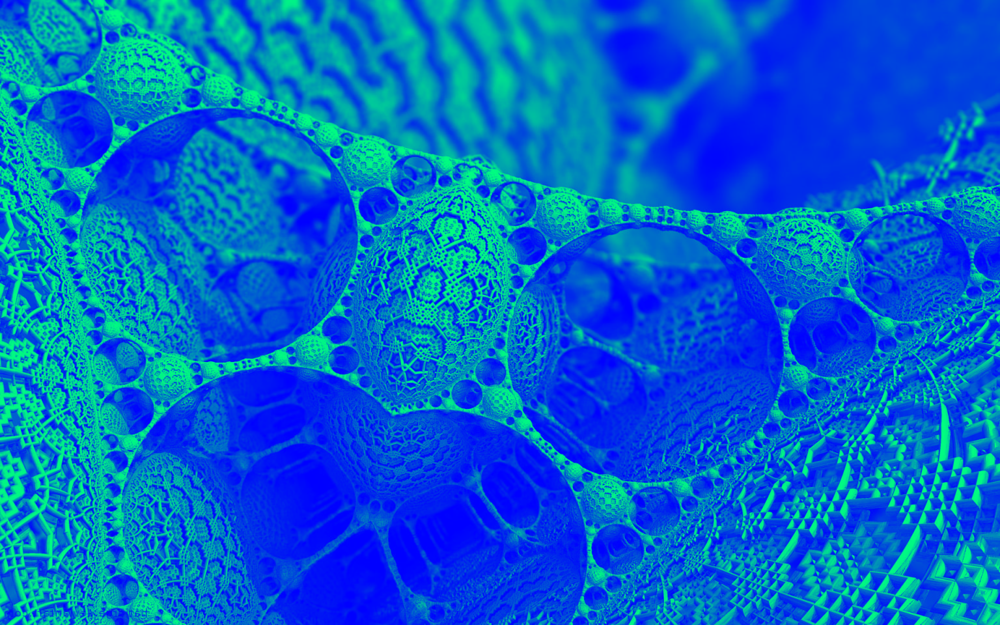

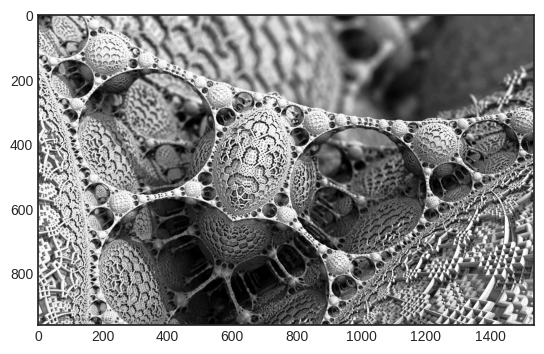

In [ ]:
from google.colab.patches import cv2_imshow
images_array = []
image = cv2.imread('/content/diamondcanvas/images/RGBA_art_url.png')
im_color = cv2.applyColorMap(image, color_map[3])
rgba = cv2.cvtColor(im_color, cv2.COLOR_RGB2RGBA)
pimg = toImgPIL(im_color)

# img is 30 x 280 but we need just one col
colors_from_img = rgba[:,:, 0]
print(colors_from_img)
plt.imshow(colors_from_img)
cv2_imshow(toImgOpenCV(pimg))

## colormaps
'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma'

In [ ]:
my_colormaps = [
    'Accent', 
  'Accent_r', 
  'Blues', 
  'Blues_r', 
  'BrBG', 
  'BrBG_r', 
  'BuGn', 
  'BuGn_r', 
  'BuPu', 
  'BuPu_r', 
  'CMRmap', 
  'CMRmap_r', 
  'Dark2', 
  'Dark2_r', 
  'GnBu', 'GnBu_r', 
  'Greens', 'Greens_r', 
  'Greys', 'Greys_r', 
  'OrRd', 'OrRd_r', 
  'Oranges', 'Oranges_r', 
  'PRGn', 'PRGn_r', 'Paired', 
  'Paired_r', 'Pastel1', 
  'Pastel1_r', 'Pastel2', 
  'Pastel2_r', 'PiYG', 'PiYG_r', 
  'PuBu', 'PuBuGn', 'PuBuGn_r', 
  'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 
  'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 
  'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 
  'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 
  'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 
  'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 
  'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 
  'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 
  'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 
  'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 
  'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 
  'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 
  'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 
  'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 
  'gnuplot_r', 'gray', 'gray_r', 
  'hot', 'hot_r', 
  'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 
  'inferno_r', 'jet', 'jet_r', 
  'magma']

In [ ]:
from PIL import Image

img = Image.open("/content/diamondcanvas/images/RGBA_art_url_64_166x117.png").convert("L") 

max_colors = 128

print(img.getcolors(max_colors))

[(1746, 1), (1920, 6), (1628, 11), (1885, 14), (1829, 18), (1936, 21), (1989, 24), (2167, 26), (2365, 30), (1948, 34), (3585, 37), (2482, 39), (2285, 44), (2761, 45), (1825, 49), (2204, 50), (1477, 53), (2023, 54), (1720, 57), (2499, 59), (1720, 60), (2174, 63), (1489, 65), (2685, 67), (1456, 68), (1840, 71), (1994, 73), (2167, 77), (2016, 80), (2054, 83), (1927, 88), (2090, 89), (1700, 94), (1474, 97), (1898, 99), (2004, 101), (1820, 108), (2358, 109), (2034, 116), (1631, 117), (1277, 120), (1218, 124), (2002, 128), (1960, 131), (1882, 134), (2233, 141), (1849, 142), (1511, 149), (2509, 151), (1416, 156), (2035, 163), (2139, 165), (1660, 171), (2206, 179), (2094, 182), (2123, 190), (1711, 199), (1874, 204), (2216, 215), (2103, 224), (1565, 233), (1692, 239), (2660, 248)]


[[0.00392157 0.00784314 0.00784314 1.        ]
 [0.02745098 0.02352941 0.02352941 1.        ]
 [0.07058824 0.07843138 0.05490196 1.        ]
 ...
 [0.43137255 0.4392157  0.3372549  1.        ]
 [0.43529412 0.4745098  0.44313726 1.        ]
 [0.3254902  0.3647059  0.35686275 1.        ]]
color:0  [#010202] 
color:1  [#080706] 
color:2  [#141610] 
color:3  [#262b23] 
color:4  [#454b3e] 
color:5  [#535641] 
color:6  [#535543] 
color:7  [#4c4e3c] 
color:8  [#63654d] 
color:9  [#848666] 
color:10  [#88896a] 
color:11  [#838466] 
color:12  [#74755a] 
color:13  [#9d9e7c] 
color:14  [#898a6b] 
color:15  [#a6a783] 
color:16  [#919370] 
color:17  [#7a7c60] 
color:18  [#f0f3d3] 
color:19  [#dee3c3] 
color:20  [#b8ba9c] 
color:21  [#595d4f] 
color:22  [#4b4d3e] 
color:23  [#5c604f] 
color:24  [#94977d] 
color:25  [#80826d] 
color:26  [#94977f] 
color:27  [#a4a788] 
color:28  [#8c8e6c] 
color:29  [#989a78] 
color:30  [#c6c8a5] 
color:31  [#eef0d0] 
color:32  [#c2c6a7] 
color:33  [#9ca186] 
color:34

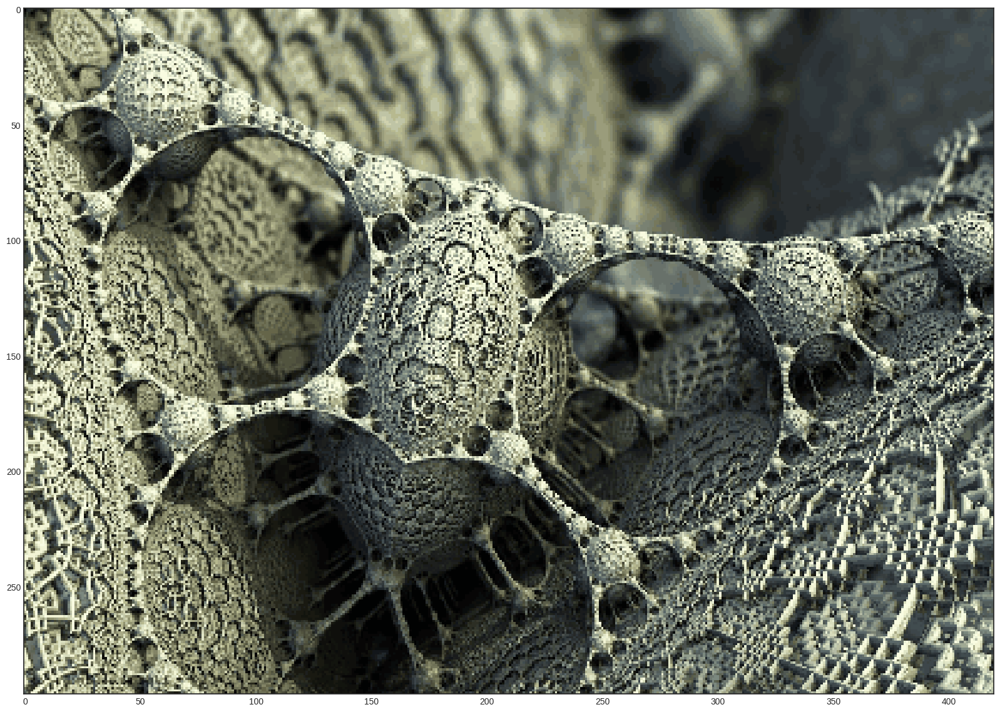

In [ ]:
from matplotlib.image import imread
from matplotlib.colors import LinearSegmentedColormap
import matplotlib

img = imread('/content/diamondcanvas/images/RGBA_art_url_64_166x117.png')

# img is 30 x 280 but we need just one col
colors_from_img = img[:, 0, :]
print(colors_from_img)
# commonly cmpas have 256 entries, but since img is 280 px => N=280
my_cmap = LinearSegmentedColormap.from_list('my_cmap', colors_from_img, N=280)
for i in range(my_cmap.N):
    print("color:" + str(i)+ "  [", end="")
    
    rgba = my_cmap(i)
    # rgb2hex accepts rgb or rgba
    print(matplotlib.colors.rgb2hex(rgba), end="")
    print(matplotlib.colors.LinearSegmentedColormap(rgba), end="")

    print('] ')

print(len(my_colormaps))

plt.figure(figsize = (20,20))
plt.imshow(img, cmap=my_colormaps[100], interpolation='nearest')
#plt.imshow(img, cmap=my_cmap)

In [ ]:
colors_from_img[1]

array([0.02745098, 0.02352941, 0.02352941, 1.        ], dtype=float32)

In [ ]:
list_of_colors = [[255,0,0],[10,150,77],[75,99,23],[45,88,250],[250,0,255]]
color = [155,155,155]

def closest(colors,color):
    colors = np.array(colors)
    color = np.array(color)
    distances = np.sqrt(np.sum((colors-color)**2,axis=1))
    index_of_smallest = np.where(distances==np.amin(distances))
    smallest_distance = colors[index_of_smallest]
    return smallest_distance 

closest_color = closest(list_of_colors,color)
print(closest_color )

[[ 45  88 250]]


In [ ]:
from PIL import ImageColor

ImageColor.getrgb("orange")
(255, 165, 0)
ImageColor.getcolor("orange", "RGB")
(255, 165, 0)
ImageColor.getcolor("orange", "RGBA")
(255, 165, 0, 255)
ImageColor.getcolor("orange", "L")
173
len(ImageColor.colormap)
148
color_items = list(sorted(ImageColor.colormap.items()))


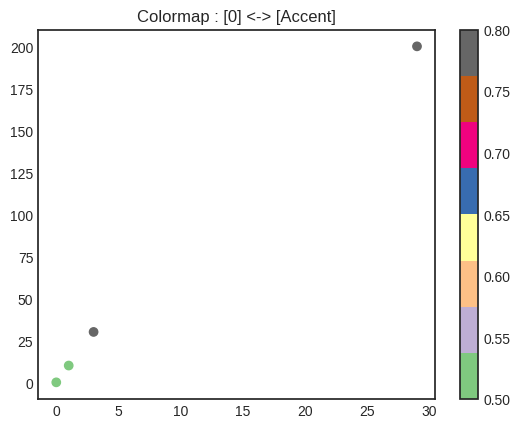

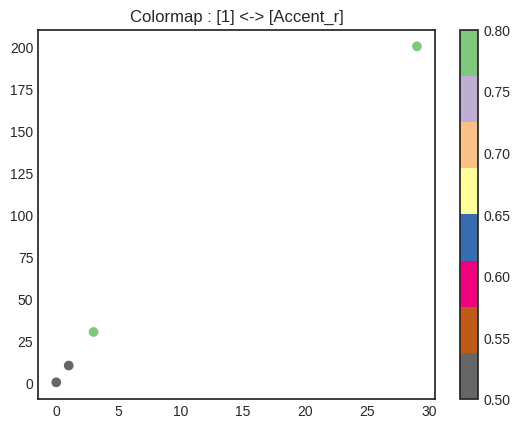

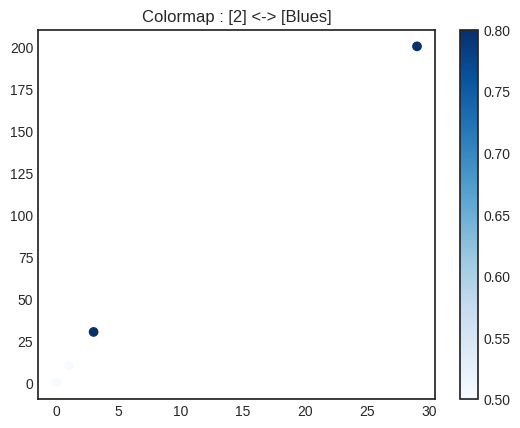

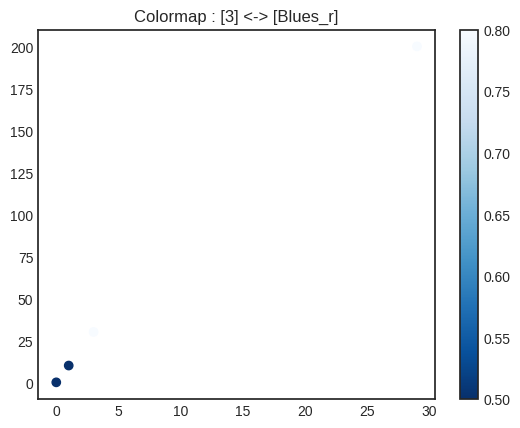

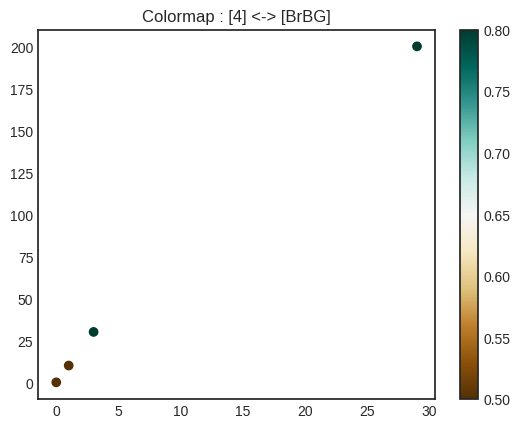

...

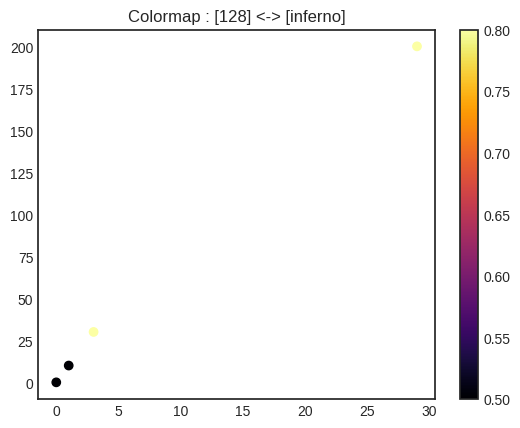

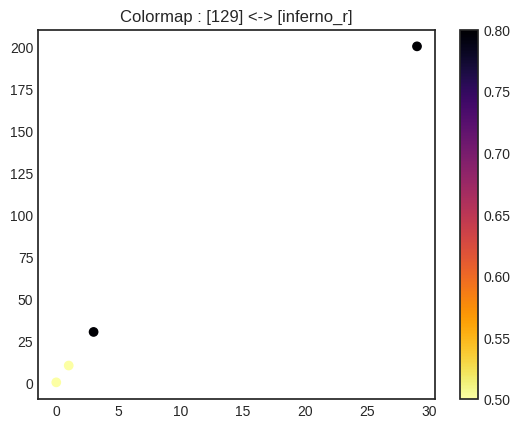

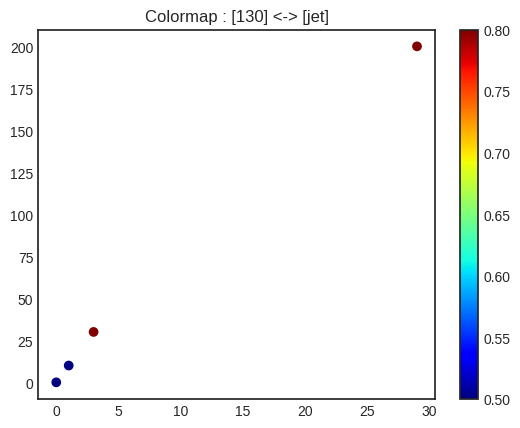

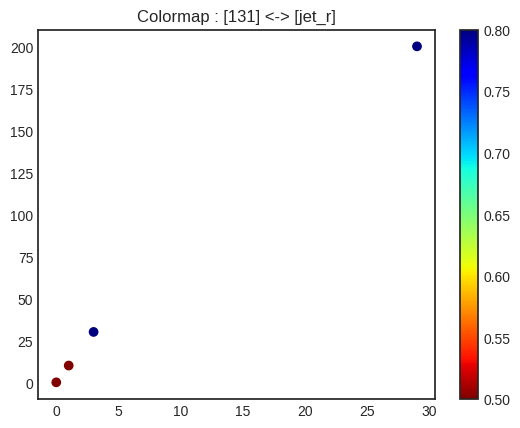

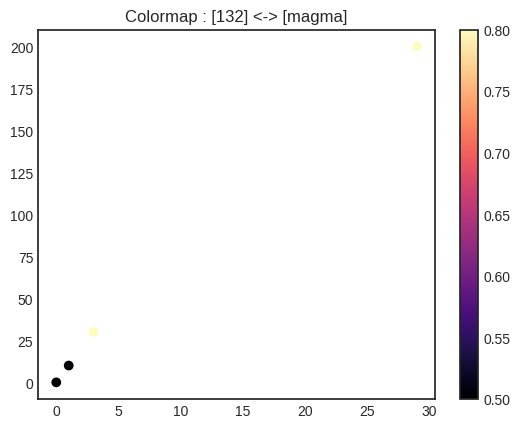

In [ ]:
import matplotlib.pyplot as plt

t1 = [0,1,29,3]
t2 = [0, 10, 200, 30]
v = [0.5, 0.5, 0.8, 0.8]
for i in range(len(my_colormaps)):
  plt.scatter(t1, t2, c=v, cmap=my_colormaps[i])
  plt.title("Colormap : [" + str(i) + "] <-> [" + str(my_colormaps[i]) + "]")
  plt.colorbar()
  plt.show()
    